In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

import warnings
warnings.filterwarnings('ignore')

food_df = pd.read_csv('food_ratings_letter_grades.csv')
#test = food_csv.head()

In [2]:
filter_radio = alt.binding_radio(options = ['D', 'C', 'B', 'A', 'A+'], name = 'Food Ratings: ')
filter_selection = alt.selection_point(fields = ['Food Letter Grades'], bind = filter_radio)

plot_1 = alt.Chart(food_df).mark_circle().encode(
    alt.X('POPULATION:Q', title = 'City Population'),

    alt.Y('Total price for in-state students living on campus 2022-23:Q',
          title = 'Total price, in-state, on campus 2022-23', 
          scale=alt.Scale(domain=[75000, 90000])),

    alt.Color('Food Letter Grades:N', 
              title = 'Food Letter Grades Ratings',
              sort=['A+', 'A', 'B', 'C', 'D']),
    alt.Tooltip(['NAME:N','STATE:N', 'Food Letter Grades:N',
                 'Total price for in-state students living on campus 2022-23:Q'])
).transform_filter(
    'datum["Total price for in-state students living on campus 2022-23"] >= 80000'
).properties(
    title = 'Food ratings vs Total Tuition above $80k, In-State On Campus 2022-2023'
).add_params(
    filter_selection
).transform_filter(
    filter_selection
)
#plot_1

In [3]:
max(food_df['Food Ratings'])

4.0

In [4]:
max(food_df['POPULATION'])

154991

In [5]:
filter_radio = alt.binding_radio(options = ['D', 'C', 'B', 'A', 'A+'], name = 'Food Ratings: ')
filter_selection = alt.selection_point(fields = ['Food Letter Grades'], bind = filter_radio)

plot_2 = alt.Chart(food_df).mark_circle().encode(
    alt.X('POPULATION:Q', title = 'City Population'),

    alt.Y('Total price for in-state students living on campus 2021-22:Q',
          title = 'Total price, in-state, on campus 2021-22', 
          scale=alt.Scale(domain=[75000, 90000])),

    alt.Color('Food Letter Grades:N', 
              title = 'Food Letter Grades Ratings',
              sort=['A+', 'A', 'B', 'C', 'D']),
    alt.Tooltip(['NAME:N','STATE:N', 'Food Letter Grades:N',
                 'Total price for in-state students living on campus 2021-22:Q'])
).transform_filter(
    'datum["Total price for in-state students living on campus 2021-22"] >= 80000'
).properties(
    title = 'Food ratings vs Total Tuition above $80k, In-State On Campus 2021-2022'
).add_params(
    filter_selection
).transform_filter(
    filter_selection
)


#plot_2


In [6]:
plot_1_2 = plot_1 | plot_2
plot_1_2.save('plot_1_2.html')
plot_1_2

alt.HConcatChart(...)

These side-by-side scatter plots compare food ratings against total tuition costs for in-state students living on campus, focusing on schools over $80,000. The x-axis represents the city population, while the y-axis shows the total tuition cost. The left plot covers the 2022-2023 academic year, and the right one represents 2021-2022.

The color-coded dots in the 2022-2023 plot represent different food rating grades, allowing us to see if higher tuition correlates with better-rated food options. However, no strong pattern emerges, as various food grades appear across the tuition range, regardless of city size. The 2021-2022 plot, though more straightforward without color differentiation, similarly shows that city population doesn’t significantly impact tuition or food ratings. These plots suggest that tuition costs and city size may not be reliable indicators of food quality, highlighting the variability in factors influencing food ratings across campuses.

In [7]:
from vega_datasets import data

# getting the average rating from each state
df_avg_ratings = food_df.groupby('STATE')['Food Ratings'].mean().reset_index()

#df_school_food

# adding the column for later graphing
df_avg_ratings.columns = ['STATE', 'Average Rating']


# Load the US states topology data
states = alt.topo_feature(data.us_10m.url, 'states')

state_id_mapping = {
    'AL': 1, 'AK': 2, 'AZ': 4, 'AR': 5, 'CA': 6, 'CO': 8, 'CT': 9, 'DE': 10, 'DC': 11, 
    'FL': 12, 'GA': 13, 'HI': 15, 'ID': 16, 'IL': 17, 'IN': 18, 'IA': 19, 'KS': 20, 'KY': 21, 
    'LA': 22, 'ME': 23, 'MD': 24, 'MA': 25, 'MI': 26, 'MN': 27, 'MS': 28, 'MO': 29, 'MT': 30, 
    'NE': 31, 'NV': 32, 'NH': 33, 'NJ': 34, 'NM': 35, 'NY': 36, 'NC': 37, 'ND': 38, 'OH': 39, 
    'OK': 40, 'OR': 41, 'PA': 42, 'RI': 44, 'SC': 45, 'SD': 46, 'TN': 47, 'TX': 48, 'UT': 49, 
    'VT': 50, 'VA': 51, 'WA': 53, 'WV': 54, 'WI': 55, 'WY': 56
}

# Map state abbreviations to their IDs in your dataframe
df_avg_ratings['id'] = df_avg_ratings['STATE'].map(state_id_mapping)

# Base map chart with colored states
plot_3 = alt.Chart(states).mark_geoshape().encode(
    color=alt.Color('Average Rating:Q',scale=alt.Scale(scheme='blues')),  
    tooltip=['STATE:N', 'Average Rating:Q']  
).transform_lookup(
    lookup='id',  # Lookup the state ID in the TopoJSON data
    from_=alt.LookupData(df_avg_ratings, 'id', ['STATE', 'Average Rating'])  # Use df_avg_ratings for the data
).project(
    type='albersUsa'  # Use Albers USA projection
).properties(
    width=700,
    height=500,
    title = 'Average rating across states in the US'
)
plot_3.save('plot_3.html')
plot_3

alt.Chart(...)

This choropleth map visualizes the average food rating across different U.S. states. Each state is shaded based on its average rating, with darker colors representing higher ratings. This map allows for a quick geographic overview of food quality by state.

At a glance, we can see which regions generally have higher or lower food ratings. For example, states with darker shades may indicate areas with better-rated food options, while lighter shades suggest regions with lower average ratings. This visualization helps highlight potential regional trends in food quality, prompting further exploration into factors that might contribute to these differences, such as local policies, demographics, or cost of living.

In [8]:
'''
# visualisation 4
# retrieving the tuition data
tuition = food_df.iloc[:,11]


plot_4 = alt.Chart(food_df).mark_square().encode(
    alt.X('Total price for in-state students living off campus (not with family) 2022-23', title='Total price for in-state students living off campus (not with family) 2022-23'),
    alt.Y('Food Ratings', title='Food Ratings')
).properties(
    width = 500,
    height = 500,
    title = 'Tuition vs Food Ratings across all schools'
)

plot_4.save('plot_4.html')
plot_4
'''

"\n# visualisation 4\n# retrieving the tuition data\ntuition = food_df.iloc[:,11]\n\n\nplot_4 = alt.Chart(food_df).mark_square().encode(\n    alt.X('Total price for in-state students living off campus (not with family) 2022-23', title='Total price for in-state students living off campus (not with family) 2022-23'),\n    alt.Y('Food Ratings', title='Food Ratings')\n).properties(\n    width = 500,\n    height = 500,\n    title = 'Tuition vs Food Ratings across all schools'\n)\n\nplot_4.save('plot_4.html')\nplot_4\n"

In [9]:
# Binning the 'Total price for in-state students living off campus (not with family) 2022-23' to create fewer box plots, excluding null values
food_df = food_df.dropna(subset=['Total price for in-state students living off campus (not with family) 2022-23'])
food_df['Price Range'] = pd.cut(
    food_df['Total price for in-state students living off campus (not with family) 2022-23'],
    bins=[0, 20000, 40000, 60000, 80000, 100000],
    labels=['0-20k', '20k-40k', '40k-60k', '60k-80k', '80k-100k']
)

# Creating a box plot with binned price ranges
plot_4 = alt.Chart(food_df).mark_boxplot().encode(
    x=alt.X('Price Range:N', 
            title='Total Price Range for In-State Students Living Off Campus (not with family) 2022-23'),
    y=alt.Y('Food Ratings:Q', 
            title='Food Ratings')
).properties(
    title='Box Plot of Food Ratings vs Total Price Range for In-State Students Living Off Campus (2022-23)',
    width=700,
    height=500
)

plot_4.save('plot_4.html')
plot_4

alt.Chart(...)

 The box plot compares food ratings across five tuition price ranges for in-state students living off-campus. Each range represents tuition from $0 to $100,000, divided into $20,000 intervals. The median line within each box shows the typical food rating, while the box height (IQR) indicates variability. Taller boxes suggest greater variability in food quality, while shorter boxes indicate more consistency. Outliers are universities with unusually high or low food ratings for their price range. By comparing medians, we can assess if higher tuition tends to result in better food ratings. Consistent higher median ratings across higher tuition ranges may suggest a positive correlation between tuition and food quality. 

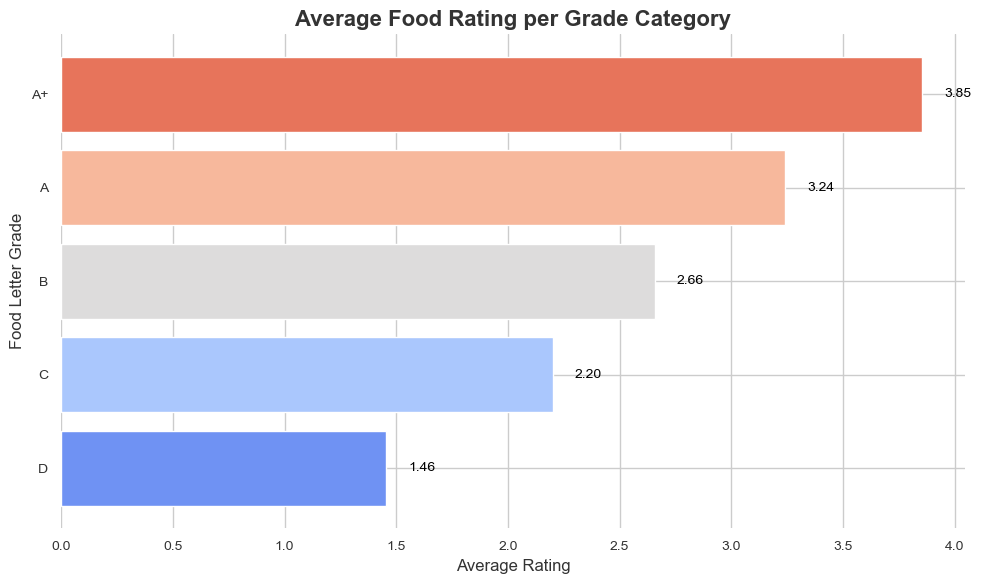

In [10]:
#Static plot
# average rating per grade category
avg_rating_per_grade = food_df.groupby('Food Letter Grades')['Food Ratings'].mean().sort_values()

# set up the plot style and color palette
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

#create the bar blot 
bars = plt.barh(avg_rating_per_grade.index, avg_rating_per_grade.values, color=sns.color_palette("coolwarm", len(avg_rating_per_grade)))

for bar, value in zip(bars, avg_rating_per_grade.values):
    plt.text(value + 0.1, bar.get_y() + bar.get_height()/2, f"{value:.2f}", va='center', ha='left', fontsize=10, color='black')

plt.title("Average Food Rating per Grade Category", fontsize=16, fontweight='bold', color='#333333')
plt.xlabel("Average Rating", fontsize=12, color='#333333')
plt.ylabel("Food Letter Grade", fontsize=12, color='#333333')
plt.xticks(fontsize=10, color='#333333')
plt.yticks(fontsize=10, color='#333333')

# for a cleaner look, remove spines
sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()


This bar chart displays the average food rating for each letter grade category, highlighting the difference in quality across ratings. "A+" grades, shown at the top, have the highest average rating, which suggests these establishments maintain a higher standard. In contrast, grades like "C" and "D" are notably lower, reinforcing that lower grades often correlate with lower food quality.

The gradient color scheme visually reinforces the progression from high to low ratings, making it easy to compare categories at a glance. This visualization clearly shows how food quality decreases as the letter grade drops, providing a straightforward look into the relationship between grades and average food ratings.

In [12]:
# Create side-by-side box plot to compare tuition and letter grade

# Define a color scale using seaborn's coolwarm palette
coolwarm_palette = sns.color_palette("coolwarm", 5).as_hex()
color_scale = alt.Scale(domain=['D', 'C', 'B', 'A', 'A+'], range=coolwarm_palette)

side_by_side_boxplot = alt.Chart(food_df).mark_boxplot().encode(
    x=alt.X('Food Letter Grades:N', title='Food Letter Grades', sort=['A+', 'A', 'B', 'C', 'D'], axis=alt.Axis(labelAngle=0)),
    y=alt.Y('Total price for in-state students living off campus (not with family) 2022-23:Q', title='Tuition In-State, Off Campus (2022-23)'),
    color=alt.Color('Food Letter Grades:N', scale=color_scale, legend=None)
).properties(
    title=alt.TitleParams(
        text="Comparison of Tuition by Food Letter Grade",
        fontSize=16,
        fontWeight='bold',
        color='#333'
    ),
    width=350,
    height=450
)

side_by_side_boxplot.save('plot_6.html')
side_by_side_boxplot


alt.Chart(...)

The side-by-side box plot provides insights into the relationship between **tuition costs** and **food quality** (in food letter grades). Higher food letter grades like 'A+' or 'A' have distinct tuition ranges compared to lower grades like 'C' or 'D'. If the median tuition value is higher for better food letter grades, it could indicate that universities providing better food tend to charge more for tuition. Conversely, if the median for lower food grades is similar to or higher than better grades, it could suggest that high tuition does not guarantee better food quality. <br>
Additionally, the variability (height of the boxes) within each grade shows how consistent tuition prices are across universities with similar food quality. Narrow boxes indicate consistent pricing, while wider boxes indicate a greater spread, suggesting inconsistencies in how universities charge for similar food quality. 

**Summary**

As we dug into the data, a few clear patterns emerged, but we also found some surprising insights that challenged our assumptions about food quality and college costs.

First, the relationship between food grades and ratings was as expected: higher grades like "A" and "A+" came with better ratings, while lower grades tended to cluster around lower scores. This makes sense — schools with stricter food quality standards seem to achieve higher ratings. But when we looked at tuition, things got interesting. Intuitively, you might think schools with sky-high tuition would also offer top-rated food. However, the data didn't back this up. We found no firm link between tuition costs and food ratings. Schools charging over $80,000 didn't consistently deliver higher-rated food, suggesting that a hefty price tag doesn't necessarily mean better quality in the dining hall.

Looking at geographic patterns, we used a map to visualize food ratings by state, hoping to find regional trends. While there were some differences in average ratings, there wasn't a striking pattern linking certain regions to better food quality. It made me think about how factors like local culture or state policies might subtly influence dining options, but they're probably not the whole story.

Lastly, we looked at how food ratings varied with city population size. Again, I expected larger, more urban campuses to have better food due to more diverse vendor options or higher standards, but that assumption didn't hold up either. Food quality seemed to be all over the map, regardless of the city size or school tuition.

In the end, this analysis was a reminder that factors impacting food quality on campus are likely more complex than we expected. Tuition and location alone don't tell the whole story. Likely, each school's dining choices, vendor partnerships, and even student expectations play a significant role. This leaves us with a more nuanced view: while grades can indicate food quality, other factors like tuition and location don't seem to predict much. There’s more to explore regarding understanding what students value in their campus dining experience.